In [ ]:
from google.colab import files
print("Vui lòng tải lên file kaggle.json của bạn:")
files.upload()

Vui lòng tải lên file kaggle.json của bạn:


Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"huynguyenqk","key":"da9a77083e62e6ace66fb3277f396e81"}'}

In [ ]:
!pip install -q kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d rgbnihal/c2a-dataset

# Giải nén file zip. Thêm -q để không hiển thị danh sách tất cả các file
print("\nĐang giải nén file, quá trình này có thể mất vài phút...")
!unzip -q c2a-dataset.zip
print("Giải nén hoàn tất! Dữ liệu nằm trong thư mục 'c2a-dataset'.")

Dataset URL: https://www.kaggle.com/datasets/rgbnihal/c2a-dataset
License(s): MIT
 99% 4.55G/4.57G [00:58<00:00, 291MB/s]
100% 4.57G/4.57G [00:58<00:00, 84.3MB/s]

Đang giải nén file, quá trình này có thể mất vài phút...
Giải nén hoàn tất! Dữ liệu nằm trong thư mục 'c2a-dataset'.


In [ ]:
!mv C2A_Dataset c2a-dataset

In [ ]:
# import torch
# import torch.nn as nn
# import torch.nn.functional as F

# class ChannelAttention(nn.Module):
#     """
#     Module chú ý kênh (Channel Attention Module).

#     Tính toán sự quan trọng của từng kênh đặc trưng.
#     """
#     def __init__(self, c1, r=16):  # c1: số kênh vào, r: tỉ lệ giảm
#         super(ChannelAttention, self).__init__()
#         # Sử dụng AdaptiveAvgPool2d và AdaptiveMaxPool2d để xử lý các kích thước feature map khác nhau
#         self.avg_pool = nn.AdaptiveAvgPool2d(1)
#         self.max_pool = nn.AdaptiveMaxPool2d(1)

#         # Mạng Perceptron đa lớp (MLP) dùng chung cho cả hai nhánh
#         self.shared_mlp = nn.Sequential(
#             nn.Conv2d(c1, c1 // r, 1, bias=False),  # Lớp ẩn, giảm số chiều
#             nn.ReLU(),
#             nn.Conv2d(c1 // r, c1, 1, bias=False)   # Lớp đầu ra, khôi phục số chiều
#         )
#         self.sigmoid = nn.Sigmoid()

#     def forward(self, x):
#         avg_out = self.shared_mlp(self.avg_pool(x))
#         max_out = self.shared_mlp(self.max_pool(x))
#         # Cộng các đặc trưng từ hai nhánh và áp dụng Sigmoid
#         attention = self.sigmoid(avg_out + max_out)
#         return x * attention

# class SpatialAttention(nn.Module):
#     """
#     Module chú ý không gian (Spatial Attention Module).

#     Tính toán sự quan trọng của từng vị trí trong không gian.
#     """
#     def __init__(self, k=7):  # k: kích thước kernel của lớp Conv
#         super(SpatialAttention, self).__init__()
#         # Lớp tích chập để tạo ra bản đồ chú ý không gian
#         # Padding được tính để giữ nguyên kích thước không gian của feature map
#         self.conv = nn.Conv2d(2, 1, kernel_size=k, padding=(k - 1) // 2, bias=False)
#         self.sigmoid = nn.Sigmoid()

#     def forward(self, x):
#         # Áp dụng pooling theo chiều kênh (channel)
#         avg_out = torch.mean(x, dim=1, keepdim=True)
#         max_out, _ = torch.max(x, dim=1, keepdim=True)

#         # Nối hai kết quả lại với nhau để tạo thành một tensor có 2 kênh
#         attention = torch.cat([avg_out, max_out], dim=1)

#         # Áp dụng tích chập và Sigmoid
#         attention = self.sigmoid(self.conv(attention))
#         return x * attention

# class CBAM(nn.Module):
#     """
#     Khối Chú ý Tích chập (Convolutional Block Attention Module).

#     Kết hợp Channel Attention và Spatial Attention một cách tuần tự.
#     Đây là module bạn sẽ gọi trong file .yaml.
#     """
#     def __init__(self, c1, c2=None, r=16, k=7):
#         super(CBAM, self).__init__()
#         # Khởi tạo hai module con
#         self.channel_attention = ChannelAttention(c1, r)
#         self.spatial_attention = SpatialAttention(k)

#     def forward(self, x):
#         # Áp dụng Channel Attention trước
#         x = self.channel_attention(x)
#         # Sau đó áp dụng Spatial Attention
#         x = self.spatial_attention(x)
#         return x

In [ ]:
# elif m is CBAM:
#     c1 = ch[f]
#     c2 = c1
#     args = [c1, *args[1:]]

In [ ]:
# Clone YOLOv8 repo
!git clone https://github.com/huyvnnb/ultralytics.git
%cd ultralytics

# Cài đặt các dependency
!pip install -e .

Cloning into 'ultralytics'...
remote: Enumerating objects: 62319, done.
remote: Counting objects: 100% (174/174), done.
remote: Compressing objects: 100% (114/114), done.
remote: Total 62319 (delta 116), reused 64 (delta 60), pack-reused 62145 (from 2)
Receiving objects: 100% (62319/62319), 33.24 MiB | 11.39 MiB/s, done.
Resolving deltas: 100% (46449/46449), done.
/content/ultralytics
Obtaining file:///content/ultralytics
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 37.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 18.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 19.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664

In [ ]:
!mkdir /content/dataset

In [ ]:
%%writefile /content/dataset/data.yaml
train: /content/c2a-dataset/new_dataset3/train/images
val: /content/c2a-dataset/new_dataset3/val/images
test: /content/c2a-dataset/new_dataset3/test/images

# Số lượng class
nc: 1

# Tên các class
names: ['person']

Overwriting /content/dataset/data.yaml


In [ ]:
# YOLOv8n with CBAM modules placed in the Neck
# Thử nghiệm đặt CBAM sau các khối C2f của Neck.
%%writefile /content/dataset/yolov8_cbam.yaml
nc: 1 # human
scales:
  n: [0.33, 0.25, 1024]

# YOLOv8.0n backbone (GIỮ NGUYÊN BẢN, KHÔNG CÓ CBAM)
backbone:
  - [-1, 1, Conv, [64, 3, 2]]   # 0-P1/2
  - [-1, 1, Conv, [128, 3, 2]]  # 1-P2/4
  - [-1, 3, C2f, [128, True]]   # 2
  - [-1, 1, Conv, [256, 3, 2]]  # 3-P3/8
  - [-1, 6, C2f, [256, True]]   # 4
  - [-1, 1, Conv, [512, 3, 2]]  # 5-P4/16
  - [-1, 6, C2f, [512, True]]   # 6
  - [-1, 1, Conv, [1024, 3, 2]] # 7-P5/32
  - [-1, 3, C2f, [1024, True]]  # 8
  - [-1, 1, SPPF, [1024, 5]]    # 9

# YOLOv8.0n head/neck with CBAM
head:
  - [-1, 1, nn.Upsample, [None, 2, "nearest"]] # 10
  - [[-1, 6], 1, Concat, [1]] # 11: cat backbone P4
  - [-1, 3, C2f, [512]]       # 12
  - [-1, 1, CBAM, [512]]      # 13 <<<<<<< CBAM ĐẶT Ở ĐÂY

  - [-1, 1, nn.Upsample, [None, 2, "nearest"]] # 14
  - [[-1, 4], 1, Concat, [1]] # 15: cat backbone P3
  - [-1, 3, C2f, [256]]       # 16 (P3/8-small)
  - [-1, 1, CBAM, [256]]      # 17 <<<<<<< CBAM ĐẶT Ở ĐÂY

  - [-1, 1, Conv, [256, 3, 2]] # 18
  - [[-1, 13], 1, Concat, [1]] # 19: cat head P4 (chú ý index từ lớp 13)
  - [-1, 3, C2f, [512]]       # 20 (P4/16-medium)
  - [-1, 1, CBAM, [512]]      # 21 <<<<<<< CBAM ĐẶT Ở ĐÂY

  - [-1, 1, Conv, [512, 3, 2]] # 22
  - [[-1, 9], 1, Concat, [1]] # 23: cat head P5
  - [-1, 3, C2f, [1024]]      # 24 (P5/32-large)
  # Lớp C2f cuối cùng có thể không cần CBAM để giữ nguyên đặc trưng cho Detect

  # Lớp Detect sẽ lấy đầu ra từ các nhánh đã qua CBAM và nhánh cuối cùng
  - [[17, 21, 24], 1, Detect, [nc]] # Detect(P3, P4, P5)

Writing /content/dataset/yolov8_cbam.yaml


In [ ]:
%cd /content/ultralytics

/content/ultralytics


In [ ]:
!yolo detect train \
  model=/content/dataset/yolov8_cbam.yaml \
  data=/content/dataset/data.yaml \
  epochs=50 \
  imgsz=640 \
  batch=16 \
  project=/content

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
WARNING ⚠️ no model scale passed. Assuming scale='n'.
Ultralytics 8.3.156 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, im

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp -r /content/train/ /content/drive/MyDrive/training_cbam/epoch_34/

In [ ]:
!cp -r /content/drive/MyDrive/training_cbam/epoch_34/ /content

In [ ]:
%cd ultralytics

/content/ultralytics


In [ ]:
!yolo detect train \
  model=/content/epoch_34/train/weights/last.pt \
  data=/content/dataset/data.yaml \
  epochs=50 \
  batch=16 \
  imgsz=640 \
  project=/content \
  resume=True # Cờ quan trọng nhất

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.156 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, l

In [ ]:
!cp -r /content/train /content/drive/MyDrive/training_cbam/epoch_50/

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp /content/drive/MyDrive/training_cbam/epoch_50/train/weights/best.pt /content

In [ ]:
!yolo val model=/content/best.pt data=/content/dataset/data.yaml split=test imgsz=640


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.156 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8_cbam summary (fused): 96 layers, 3,010,745 parameters, 0 gradients, 8.1 GFLOPs
100% 755k/755k [00:00<00:00, 19.1MB/s]
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 50.2±10.4 MB/s, size: 277.1 KB)
val: Scanning /content/c2a-dataset/new_dataset3/test/labels... 2043 images, 0 backgrounds, 0 corrupt: 100% 2043/2043 [00:07<00:00, 291.42it/s]
val: New cache created: /content/c2a-dataset/new_dataset3/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 128/128 [00:47<00:00,  2.68it/s]
                   all       2043      72523      0.

In [ ]:
!cp -r /content/ultralytics/runs/detect/val/ /content/drive/MyDrive/training_cbam/test/

In [ ]:
# Cell 4: Script lấy mẫu ngẫu nhiên
import os
import random
import shutil

def sample_yolo_dataset(source_dir, dest_dir, num_samples):
    """
    Lấy mẫu ngẫu nhiên từ một bộ dữ liệu YOLO.
    """
    # 1. Xác định đường dẫn
    source_images_path = os.path.join(source_dir, 'images')
    source_labels_path = os.path.join(source_dir, 'labels')
    dest_images_path = os.path.join(dest_dir, 'images')
    dest_labels_path = os.path.join(dest_dir, 'labels')

    # 2. Tạo thư mục đích
    os.makedirs(dest_images_path, exist_ok=True)
    os.makedirs(dest_labels_path, exist_ok=True)

    # 3. Lấy danh sách ảnh
    try:
        all_images = [f for f in os.listdir(source_images_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
        print(f"Tìm thấy {len(all_images)} ảnh trong: {source_images_path}")
    except FileNotFoundError:
        print(f"Lỗi: Không tìm thấy thư mục {source_images_path}")
        return

    if num_samples > len(all_images):
        print(f"Lỗi: Số lượng mẫu yêu cầu ({num_samples}) lớn hơn số ảnh có sẵn ({len(all_images)}).")
        return

    # 4. Lấy mẫu ngẫu nhiên
    random.seed(42) # Giữ seed để kết quả có thể tái tạo
    sampled_images = random.sample(all_images, num_samples)
    print(f"Đã chọn ngẫu nhiên {len(sampled_images)} ảnh.")

    # 5. Sao chép file ảnh và label tương ứng
    count = 0
    for image_name in sampled_images:
        base_name = os.path.splitext(image_name)[0]
        label_name = base_name + '.txt'

        source_image_file = os.path.join(source_images_path, image_name)
        source_label_file = os.path.join(source_labels_path, label_name)

        dest_image_file = os.path.join(dest_images_path, image_name)
        dest_label_file = os.path.join(dest_labels_path, label_name)

        if os.path.exists(source_label_file):
            shutil.copy2(source_image_file, dest_image_file)
            shutil.copy2(source_label_file, dest_label_file)
            count += 1
        else:
            print(f"Cảnh báo: Bỏ qua '{image_name}' vì không tìm thấy label tương ứng.")

    print(f"Hoàn tất! Đã sao chép {count} cặp ảnh và label vào: {dest_dir}\n")


# --- CẤU HÌNH ---
# Đường dẫn thư mục trong môi trường Colab
SOURCE_TRAIN_DIR = '/content/c2a-dataset/new_dataset3/test'
DEST_DIR = '/content/dataset_sample_test' # Thư mục chứa dataset mới

NUM_TEST_SAMPLES = 10

# --- THỰC THI ---
print("--- Bắt đầu lấy mẫu cho tập TRAIN ---")
sample_yolo_dataset(SOURCE_TRAIN_DIR, os.path.join(DEST_DIR, 'test'), NUM_TEST_SAMPLES)

--- Bắt đầu lấy mẫu cho tập TRAIN ---
Tìm thấy 2043 ảnh trong: /content/c2a-dataset/new_dataset3/test/images
Đã chọn ngẫu nhiên 10 ảnh.
Hoàn tất! Đã sao chép 10 cặp ảnh và label vào: /content/dataset_sample_test/test



In [ ]:
import os
import random
import YOLO
import cv2

MODEL_PATH = '/content/best.pt'  # Đổi thành đường dẫn tới file best.pt
TEST_IMAGE_DIR = '/content/dataset_sample_test/test/images/' # Đổi thành đường dẫn tới thư mục ảnh test
OUTPUT_DIR = 'test_results' # Thư mục để lưu kết quả
NUM_IMAGES = 10 # Số lượng ảnh cần đánh giá

os.makedirs(OUTPUT_DIR, exist_ok=True)
try:
    model = YOLO(MODEL_PATH)
except Exception as e:
    print(f"Lỗi khi tải mô hình: {e}")
    exit()

try:
    all_images = [f for f in os.listdir(TEST_IMAGE_DIR) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    if len(all_images) < NUM_IMAGES:
        print(f"Cảnh báo: Thư mục test chỉ có {len(all_images)} ảnh, ít hơn {NUM_IMAGES} ảnh yêu cầu.")
        selected_images = all_images
    else:
        selected_images = random.sample(all_images, NUM_IMAGES)
except FileNotFoundError:
    print(f"Lỗi: Không tìm thấy thư mục ảnh test tại: {TEST_IMAGE_DIR}")
    exit()

print(f"Đã chọn {len(selected_images)} ảnh để đánh giá...")

for image_name in selected_images:
    image_path = os.path.join(TEST_IMAGE_DIR, image_name)

    # Chạy dự đoán trên ảnh
    results = model.predict(source=image_path, conf=0.4)
    result_image_annotated = results[0].plot()

    # Lưu ảnh kết quả
    output_path = os.path.join(OUTPUT_DIR, image_name)
    cv2.imwrite(output_path, result_image_annotated)

    print(f"Đã xử lý và lưu kết quả cho ảnh: {image_name}")

print("\nHoàn tất! Kết quả đã được lưu trong thư mục:", OUTPUT_DIR)

In [ ]:
%%writefile /content/visual_test.py
import os
import sys
import random
import cv2

# BƯỚC QUAN TRỌNG: Thêm thư mục chứa code ultralytics đã chỉnh sửa vào đường dẫn hệ thống
# Điều này đảm bảo Python sẽ import phiên bản code của bạn, không phải phiên bản gốc đã cài.
# Vì script này nằm ở /content/ và thư viện ở /content/ultralytics, chúng ta thêm '/content'
sys.path.insert(0, '/content')

# Bây giờ mới import YOLO từ thư viện ultralytics đã chỉnh sửa
from ultralytics import YOLO

# --- Cấu hình của bạn ---
MODEL_PATH = '/content/best.pt'
TEST_IMAGE_DIR = '/content/dataset_sample_test/test/images/'
OUTPUT_DIR = '/content/test_results' # Nên dùng đường dẫn tuyệt đối trong Colab
NUM_IMAGES = 10 # Số lượng ảnh cần đánh giá

# --- Bắt đầu thực thi ---

print("Bắt đầu quá trình kiểm tra trực quan...")

# Tạo thư mục đầu ra nếu chưa có
os.makedirs(OUTPUT_DIR, exist_ok=True)

# 1. Tải mô hình
try:
    print(f"Đang tải mô hình từ: {MODEL_PATH}")
    # YOLO sẽ tự động sử dụng kiến trúc từ code đã chỉnh sửa của bạn
    model = YOLO(MODEL_PATH)
    print("Tải mô hình thành công.")
except Exception as e:
    print(f"LỖI KHI TẢI MÔ HÌNH: {e}")
    print("Kiểm tra lại đường dẫn tới file best.pt và đảm bảo code ultralytics của bạn không có lỗi.")
    exit()

# 2. Lấy danh sách ảnh test
try:
    all_images = [f for f in os.listdir(TEST_IMAGE_DIR) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    if not all_images:
        print(f"LỖI: Không tìm thấy ảnh nào trong thư mục: {TEST_IMAGE_DIR}")
        exit()

    if len(all_images) < NUM_IMAGES:
        print(f"Cảnh báo: Thư mục test chỉ có {len(all_images)} ảnh, sẽ sử dụng tất cả.")
        selected_images = all_images
    else:
        selected_images = random.sample(all_images, NUM_IMAGES)
except FileNotFoundError:
    print(f"LỖI: Không tìm thấy thư mục ảnh test tại: {TEST_IMAGE_DIR}")
    exit()

print(f"Đã chọn ngẫu nhiên {len(selected_images)} ảnh để đánh giá...")

# 3. Chạy dự đoán và lưu kết quả
for image_name in selected_images:
    image_path = os.path.join(TEST_IMAGE_DIR, image_name)

    try:
        # Chạy dự đoán trên ảnh
        results = model.predict(source=image_path, conf=0.4, verbose=False) # verbose=False để log đỡ rối

        # Lấy ảnh đã được vẽ bounding box
        result_image_annotated = results[0].plot()

        # Lưu ảnh kết quả
        output_path = os.path.join(OUTPUT_DIR, image_name)
        cv2.imwrite(output_path, result_image_annotated)

        print(f"-> Đã xử lý và lưu kết quả cho ảnh: {image_name}")
    except Exception as e:
        print(f"Lỗi khi xử lý ảnh {image_name}: {e}")


print(f"\nHoàn tất! Kết quả đã được lưu trong thư mục: {OUTPUT_DIR}")
print("Bạn có thể xem các ảnh kết quả trong bảng điều khiển file bên trái của Colab.")

Writing /content/visual_test.py


In [ ]:
!pip uninstall -y ultralytics

Found existing installation: ultralytics 8.3.156
Uninstalling ultralytics-8.3.156:
  Successfully uninstalled ultralytics-8.3.156


In [ ]:
# Di chuyển vào thư mục chứa code ultralytics đã chỉnh sửa
%cd /content/ultralytics

# Chạy lệnh cài đặt ở chế độ "editable"
# Chế độ này sẽ tạo một liên kết đến thư mục code của bạn
# thay vì sao chép nó. Bất kỳ thay đổi nào bạn làm trong code
# sẽ được cập nhật ngay lập tức.
!pip install -e .

/content/ultralytics
Obtaining file:///content/ultralytics
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for ultralytics (pyproject.toml) ... done
  Created wheel for ultralytics: filename=ultralytics-8.3.156-0.editable-py3-none-any.whl size=23086 sha256=8cb3a3d6c1bb74798fcf7ace5cfe3be298ca443edabef927ec9598d0b5af52a6
  Stored in directory: /tmp/pip-ephem-wheel-cache-sqqfgtz8/wheels/ea/71/6b/a9012dfb148489fd8125c2310e565414c996b3c7721defe799
Successfully built ultralytics


In [ ]:
%cd /content/ultralytics/

/content/ultralytics


In [ ]:
!pwd

/content


In [ ]:
!yolo predict model=/content/best.pt source=/content/dataset_sample_test/test/images conf=0.4 save=True show_labels=False


Ultralytics 8.3.156 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8_cbam summary (fused): 96 layers, 3,010,745 parameters, 0 gradients, 8.1 GFLOPs

image 1/10 /content/dataset_sample_test/test/images/collapsed_building_image0156_1.png: 640x640 17 persons, 9.1ms
image 2/10 /content/dataset_sample_test/test/images/fire_image0015_1.png: 640x640 23 persons, 8.8ms
image 3/10 /content/dataset_sample_test/test/images/fire_image0109_0.png: 384x640 18 persons, 35.5ms
image 4/10 /content/dataset_sample_test/test/images/fire_image0149_2.png: 448x640 19 persons, 34.1ms
image 5/10 /content/dataset_sample_test/test/images/fire_image0281_4.png: 640x640 20 persons, 9.4ms
image 6/10 /content/dataset_sample_test/test/images/flood_image0331_3.png: 480x640 41 persons, 35.6ms
image 7/10 /content/dataset_sample_test/test/images/flood_image0408_1.png: 640x640 29 persons, 9.3ms
image 8/10 /content/dataset_sample_test/test/images/flood_image0480_4.png: 384x640 26 persons, 7.6ms
image 9/10

In [ ]:
%cd /content

/content


None


Đã lưu: /content/compare_output/without_label/fire_image0149_2.png


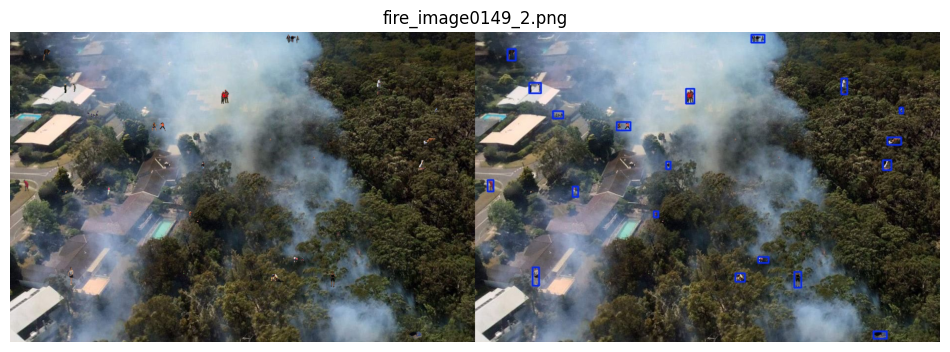

Đã lưu: /content/compare_output/without_label/flood_image0331_3.png


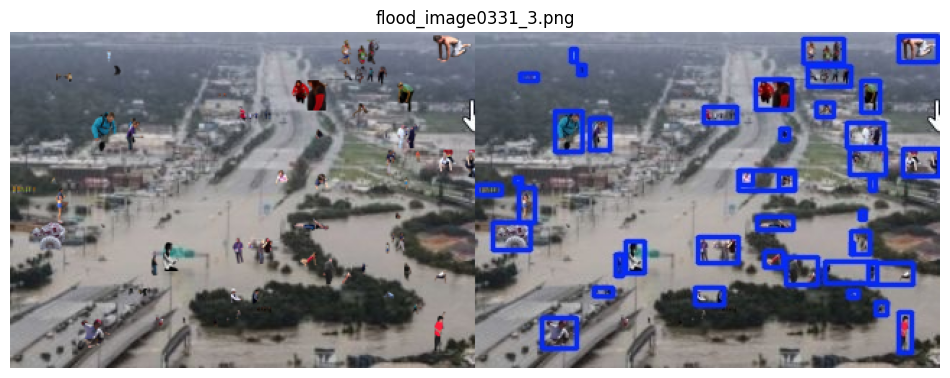

Đã lưu: /content/compare_output/without_label/fire_image0281_4.png


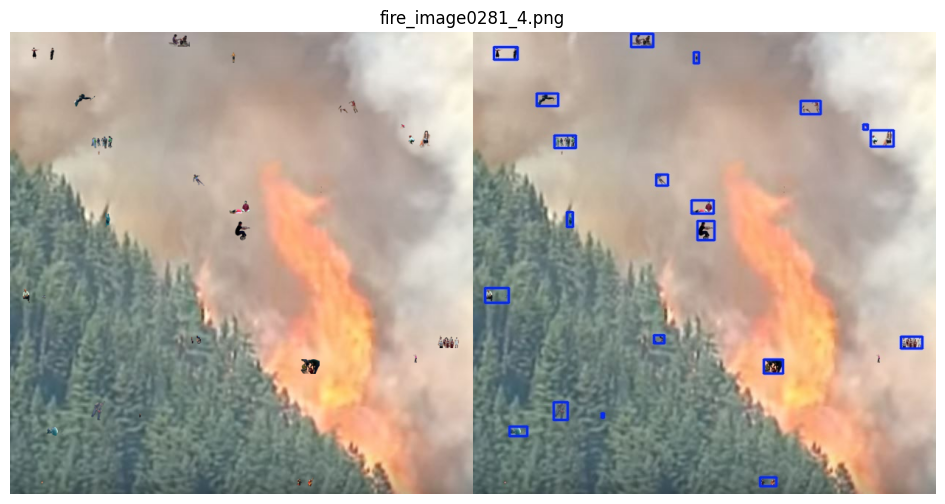

Đã lưu: /content/compare_output/without_label/traffic_incident_image0422_4.png


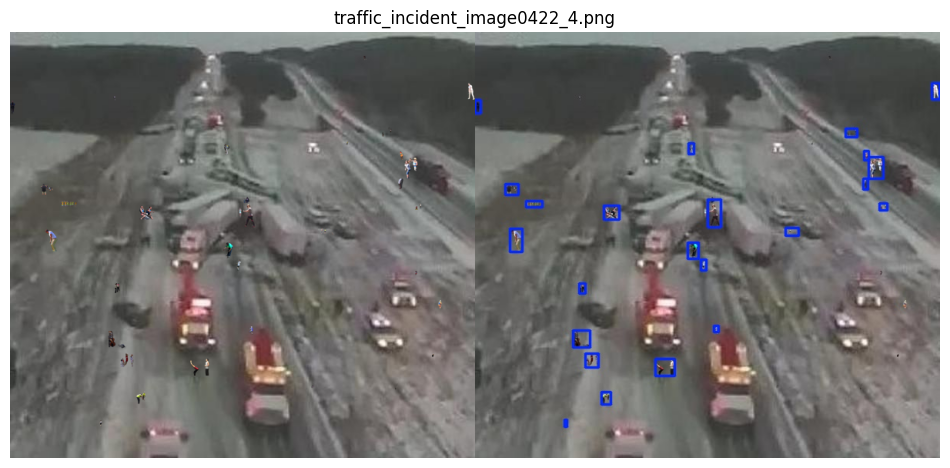

Đã lưu: /content/compare_output/without_label/fire_image0015_1.png


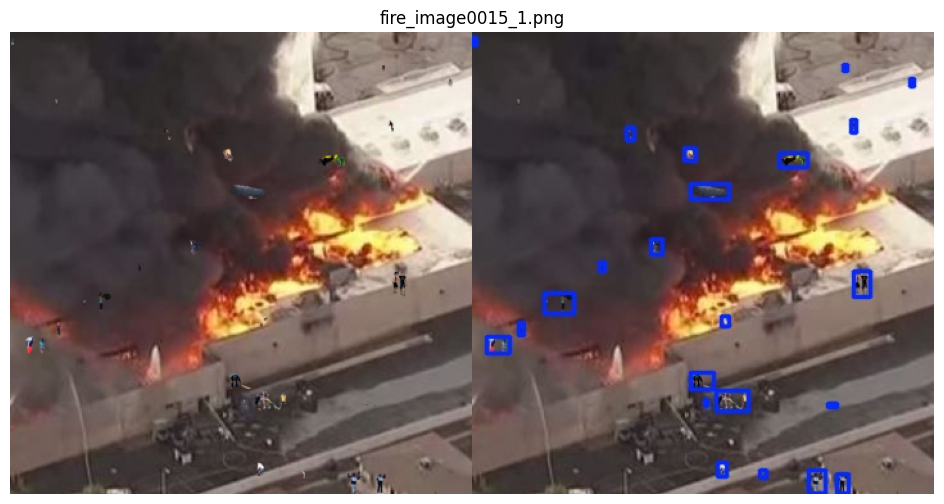

Đã lưu: /content/compare_output/without_label/flood_image0408_1.png


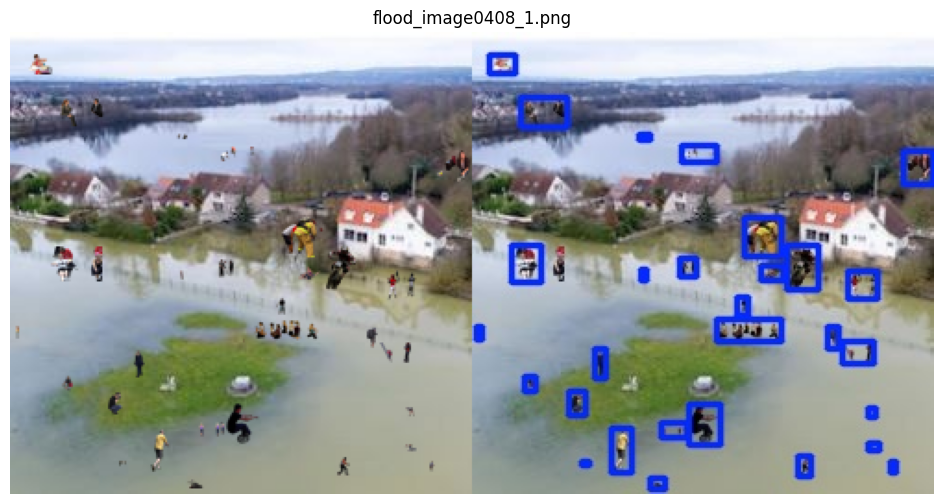

Đã lưu: /content/compare_output/without_label/flood_image0480_4.png


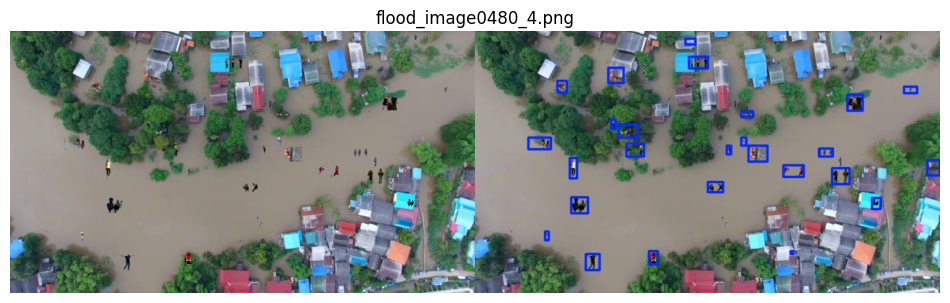

Đã lưu: /content/compare_output/without_label/fire_image0109_0.png


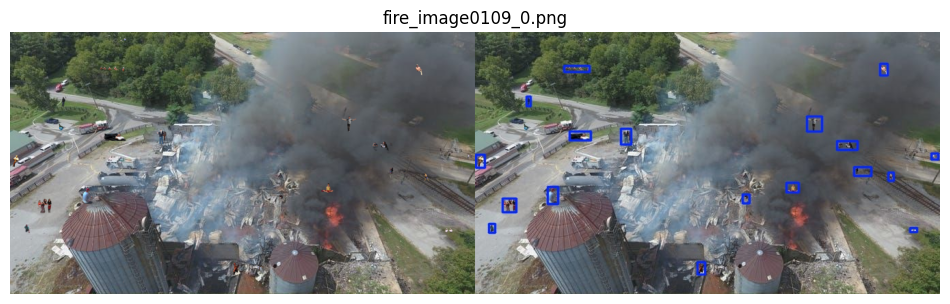

Đã lưu: /content/compare_output/without_label/traffic_incident_image0469_4.png


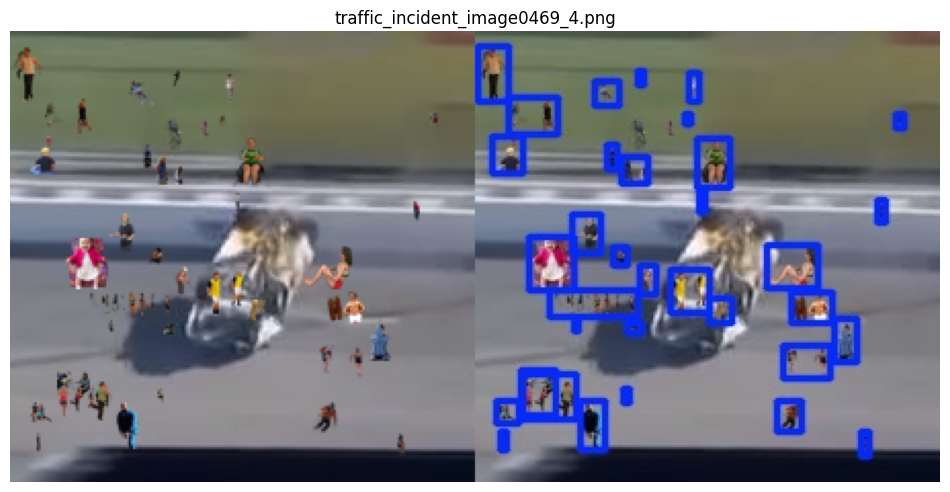

Đã lưu: /content/compare_output/without_label/collapsed_building_image0156_1.png


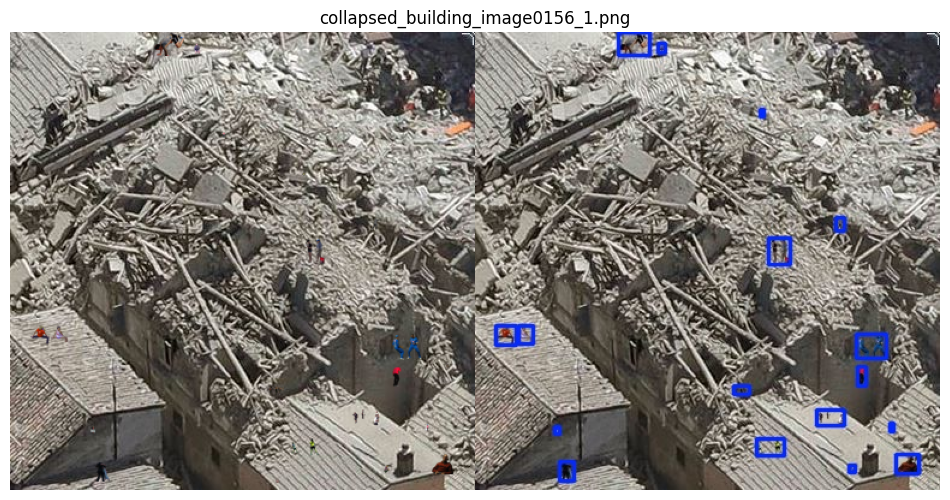

In [ ]:
import cv2
import os
import matplotlib.pyplot as plt

# Đường dẫn đến 2 thư mục ảnh
folder1 = '/content/dataset_sample_test/test/images'                     # Ảnh gốc
folder2 = '/content/ultralytics/runs/detect/predict3'                    # Ảnh đã predict
output_folder = '/content/compare_output/without_label'                                # Thư mục lưu ảnh ghép

# Tạo thư mục lưu nếu chưa có
os.makedirs(output_folder, exist_ok=True)

# Hàm tìm file trong folder2 có cùng tên gốc bất kể đuôi mở rộng
def find_matching_file(folder, base_name):
    for ext in ['.jpg', '.jpeg', '.png']:
        candidate = os.path.join(folder, base_name + ext)
        if os.path.exists(candidate):
            return candidate
    return None

# Lấy danh sách file ảnh gốc (.jpg/.png/.jpeg)
file_names = [f for f in os.listdir(folder1) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

for file_name in file_names:
    base_name = os.path.splitext(file_name)[0]  # Tên không có đuôi
    path1 = os.path.join(folder1, file_name)
    path2 = find_matching_file(folder2, base_name)

    if path2 is None:
        print(f"Bỏ qua {file_name} (không có ảnh tương ứng trong folder2)")
        continue

    # Đọc ảnh
    img1 = cv2.imread(path1)
    img2 = cv2.imread(path2)

    # Kiểm tra ảnh đọc được không
    if img1 is None or img2 is None:
        print(f"Lỗi đọc ảnh {file_name}, có thể file bị hỏng.")
        continue

    # Resize ảnh predict cho khớp với ảnh gốc nếu khác kích thước
    if img1.shape != img2.shape:
        img2 = cv2.resize(img2, (img1.shape[1], img1.shape[0]))

    # Ghép ảnh ngang (gốc trái, predict phải)
    merged = cv2.hconcat([img1, img2])

    # Lưu ảnh ghép
    save_path = os.path.join(output_folder, file_name)
    cv2.imwrite(save_path, merged)
    print(f"Đã lưu: {save_path}")

    # Hiển thị với matplotlib (chuyển BGR -> RGB)
    merged_rgb = cv2.cvtColor(merged, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(12, 6))
    plt.imshow(merged_rgb)
    plt.axis('off')
    plt.title(file_name)
    plt.show()


In [ ]:
!cp -r /content/compare_output/ /content/drive/MyDrive/training_cbam/test/predict/

Đã lưu: /content/compare_output/3views/fire_image0149_2.png


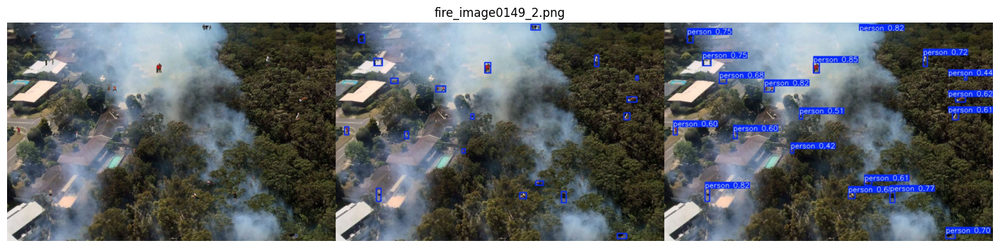

Đã lưu: /content/compare_output/3views/flood_image0331_3.png


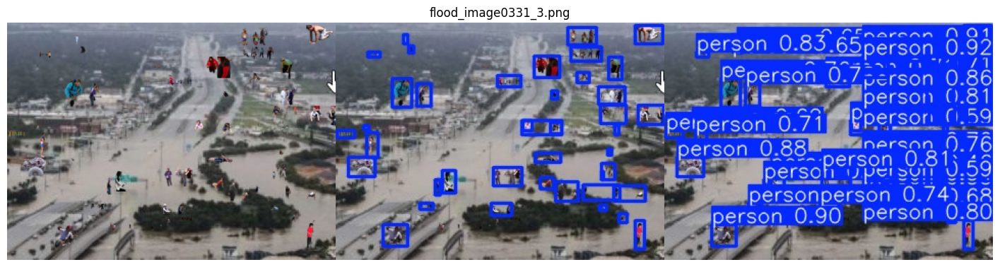

Đã lưu: /content/compare_output/3views/fire_image0281_4.png


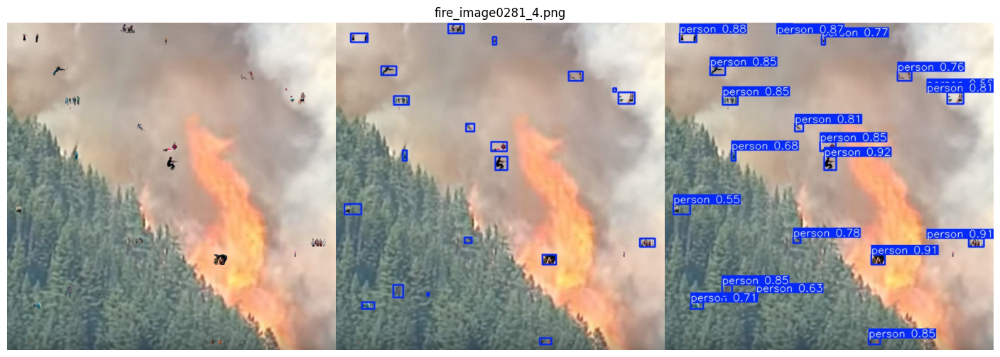

Đã lưu: /content/compare_output/3views/traffic_incident_image0422_4.png


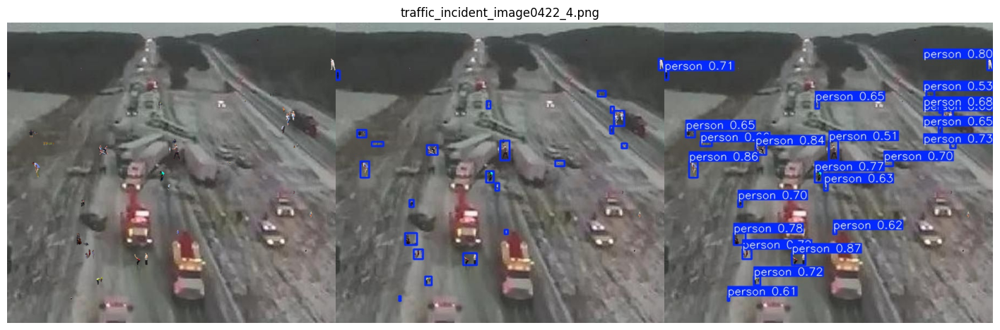

Đã lưu: /content/compare_output/3views/fire_image0015_1.png


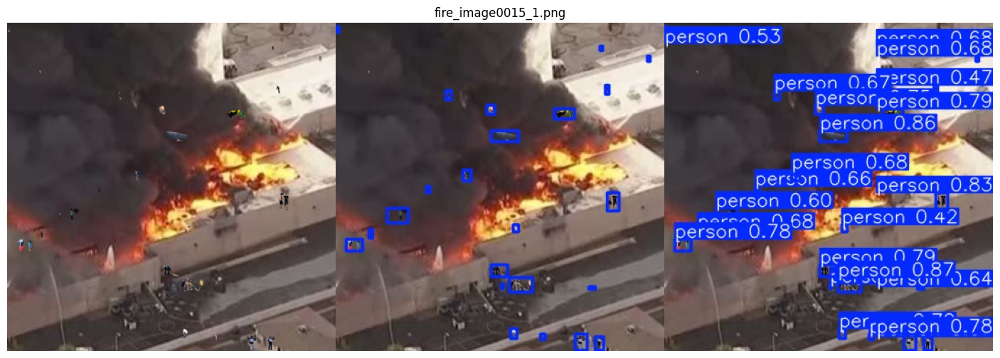

Đã lưu: /content/compare_output/3views/flood_image0408_1.png


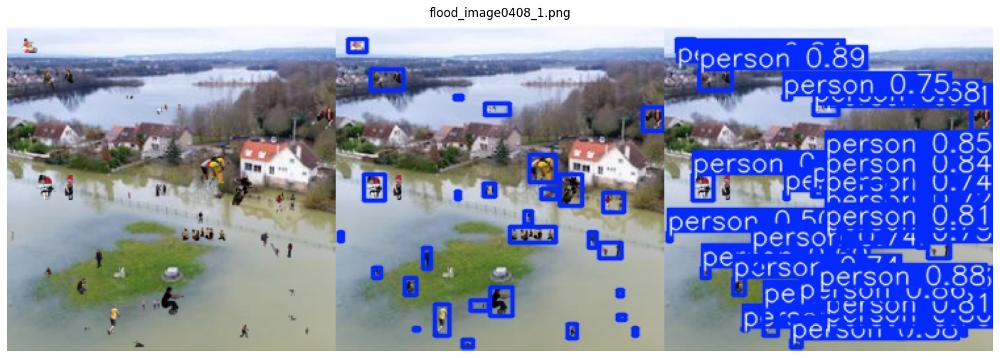

Đã lưu: /content/compare_output/3views/flood_image0480_4.png


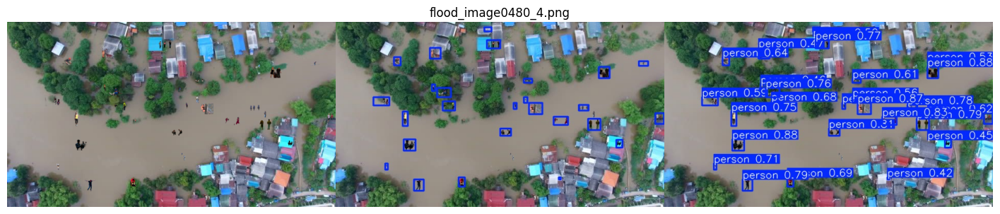

Đã lưu: /content/compare_output/3views/fire_image0109_0.png


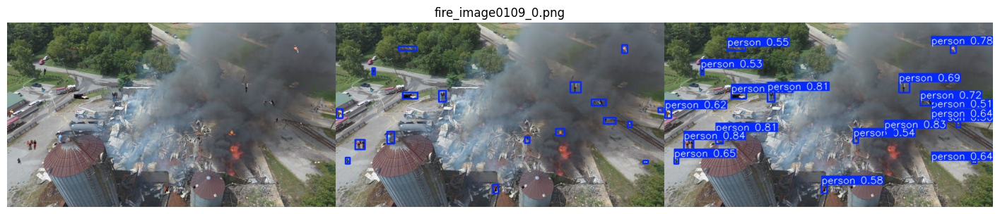

Đã lưu: /content/compare_output/3views/traffic_incident_image0469_4.png


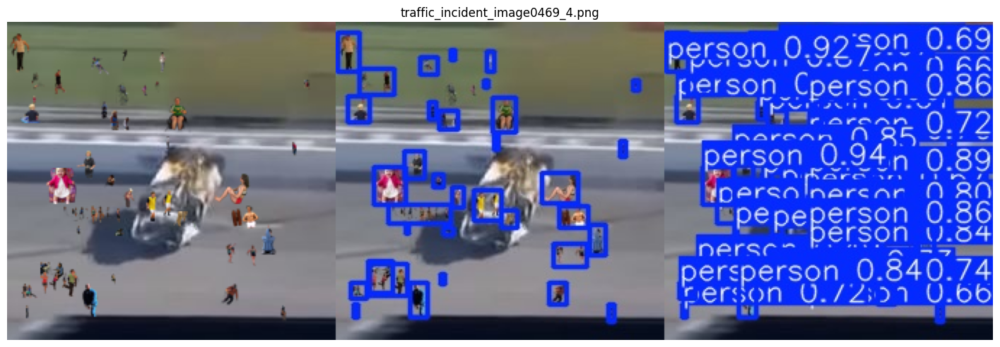

Đã lưu: /content/compare_output/3views/collapsed_building_image0156_1.png


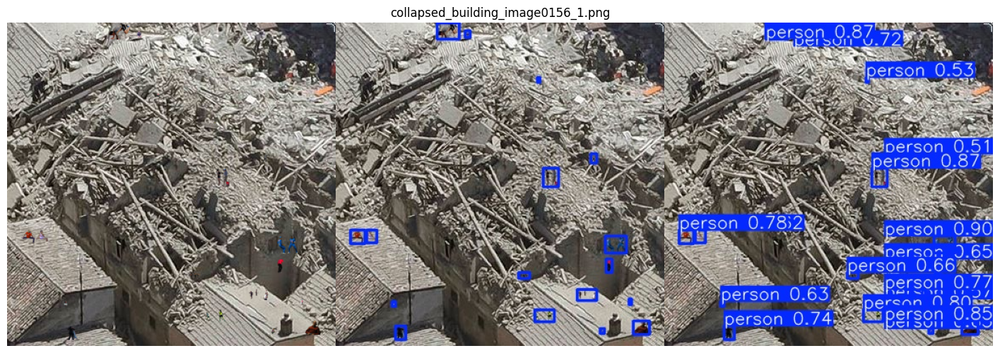

In [ ]:
import cv2
import os
import matplotlib.pyplot as plt

# 3 thư mục ảnh cần so sánh (gốc, predict1, predict2)
folder1 = '/content/dataset_sample_test/test/images'             # Ảnh gốc
folder2 = '/content/ultralytics/runs/detect/predict3'            # Dự đoán 1
folder3 = '/content/ultralytics/runs/detect/predict'            # Dự đoán 2
output_folder = '/content/compare_output/3views'                 # Nơi lưu ảnh ghép

# Tạo thư mục lưu nếu chưa có
os.makedirs(output_folder, exist_ok=True)

# Hàm tìm ảnh tương ứng bất kể phần mở rộng
def find_matching_file(folder, base_name):
    for ext in ['.jpg', '.jpeg', '.png']:
        candidate = os.path.join(folder, base_name + ext)
        if os.path.exists(candidate):
            return candidate
    return None

# Lấy danh sách ảnh từ folder1 (ảnh gốc)
file_names = [f for f in os.listdir(folder1) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

for file_name in file_names:
    base_name = os.path.splitext(file_name)[0]  # Tên không có phần mở rộng

    path1 = os.path.join(folder1, file_name)
    path2 = find_matching_file(folder2, base_name)
    path3 = find_matching_file(folder3, base_name)

    if path2 is None or path3 is None:
        print(f"Bỏ qua {file_name} (thiếu ảnh trong folder2 hoặc folder3)")
        continue

    # Đọc ảnh
    img1 = cv2.imread(path1)
    img2 = cv2.imread(path2)
    img3 = cv2.imread(path3)

    if img1 is None or img2 is None or img3 is None:
        print(f"Lỗi đọc ảnh {file_name}")
        continue

    # Resize ảnh 2 và 3 theo ảnh gốc
    target_size = (img1.shape[1], img1.shape[0])  # (width, height)
    if img2.shape[:2] != img1.shape[:2]:
        img2 = cv2.resize(img2, target_size)
    if img3.shape[:2] != img1.shape[:2]:
        img3 = cv2.resize(img3, target_size)

    # Ghép ngang 3 ảnh: gốc | predict1 | predict2
    merged = cv2.hconcat([img1, img2, img3])

    # Lưu ảnh ghép
    save_path = os.path.join(output_folder, file_name)
    cv2.imwrite(save_path, merged)
    print(f"Đã lưu: {save_path}")

    # Hiển thị
    merged_rgb = cv2.cvtColor(merged, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(18, 6))
    plt.imshow(merged_rgb)
    plt.axis('off')
    plt.title(file_name)
    plt.show()


In [ ]:
!cp -r /content/compare_output/ /content/drive/MyDrive/training_cbam/test/predict/